In [87]:
#!venv\Scripts\activate.ps1
#!pip install -r requirements.txt

In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

uci_data = pd.read_csv("train.csv")
unicamp_data = pd.read_csv("Dataset_5971.csv")
pd.set_option('display.max_colwidth',None)





After importing the necessary libraries, the next step is to clean the data, in this case, two different data sets are being used, `train.csv` is the data set from [UCI machine learning repository](https://archive.ics.uci.edu/dataset/228/sms+spam+collection) and `Dataset_5971.csv` was taken from this research paper: [SMS PHISHING DATASET FOR MACHINE LEARNING AND PATTERN RECOGNITION](https://data.mendeley.com/datasets/f45bkkt8pr/1)

the next step is to clean the data sets, and label them correctly


In [89]:
unicamp_data.rename(columns={'TEXT':'sms'},inplace=True)
unicamp_data.drop(columns=['URL','EMAIL','PHONE'],axis=1,inplace=True)

unicamp_data.loc[unicamp_data.label == 'Spam','label'] = 'spam'
unicamp_data.loc[unicamp_data.label == 'smishing','label'] = 'spam'
unicamp_data.loc[unicamp_data.label == 'Smishing','label'] = 'spam'
unicamp_data.loc[unicamp_data.label == 'Smishing']

,label,sms


In [90]:
from sklearn.preprocessing import OrdinalEncoder

ord_enc = OrdinalEncoder()

columns_change = ['label']
uniData = unicamp_data.copy()
uniData[columns_change] = ord_enc.fit_transform(unicamp_data[columns_change])

uniData = pd.concat([uci_data,uniData],ignore_index=False,sort=False)
uniData = uniData.reset_index(drop=True)
uniData




,sms,label
0,"Go until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...\n",0.0
1,Ok lar... Joking wif u oni...\n,0.0
2,Free entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 08452810075over18's\n,1.0
3,U dun say so early hor... U c already then say...\n,0.0
4,"Nah I don't think he goes to usf, he lives around here though\n",0.0
...,...,...
11540,:( but your not here....,0.0
11541,Becoz its &lt;#&gt; jan whn al the post ofice is in holiday so she cn go fr the post ofice...got it duffer,0.0
11542,Its a valentine game. . . send dis msg to all ur friends. . If 5 answers r d same then someone really loves u. . Ques- which colour suits me the best?,0.0
11543,We r outside already.,0.0


After testing for a while I noticed that my second data set had more than one style of writing 'spam' and also contained 'Spam' and the same thing for smishing.

In the case of smishing I will merge it to be the same as spam, since both terms related to the same thing and purpose of the research.

After erasing the spelling problems it is viable to apply the Ordinal Encoder to our data set, another step to simplify and test more, will be ereasing the url, email and phone for the moment, It is contemplated to take in count in the next steps

After deleting necessary columns we can fit the encoder, which is a fast way to set ham and spam as number values

# Text preprosessing
first, the text will be tokenized as is, after that, there will be experiments without stop words and applying stemmig technics


## SEGMENTING THE TEXT

In [91]:
import nltk
from nltk.tokenize import TweetTokenizer

#tweet tokenizer will be more useful to segment regular text messages conversations
nltk_tok = TweetTokenizer()


In [92]:
size = uniData.sms.size
size

11545

In [93]:
#this will be an example how the data will look
str = uniData.sms[size-1]
print(str)
str = nltk_tok.tokenize(str)
print(str)

The Xmas story is peace.. The Xmas msg is love.. The Xmas miracle is jesus.. Hav a blessed month ahead &amp; wish U Merry Xmas...
['The', 'Xmas', 'story', 'is', 'peace', '..', 'The', 'Xmas', 'msg', 'is', 'love', '..', 'The', 'Xmas', 'miracle', 'is', 'jesus', '..', 'Hav', 'a', 'blessed', 'month', 'ahead', '&', 'wish', 'U', 'Merry', 'Xmas', '...']


In [94]:

def separate_string(df,column_size):
    for i in range(column_size):
        str = df.loc[i,'sms']
        lis = nltk_tok.tokenize(str)
        df.sms[i] = lis

separate_string(uniData,size)

uniData

C:\Users\arman\AppData\Local\Temp\ipykernel_25792\1036863228.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df.sms[i] = lis
C:\Users\arman\AppData\Local\Temp\ipykernel_25792\1036863228.py:5: SettingWithCopyWarning: 
A value is trying to

,sms,label
0,"[Go, until, jurong, point, ,, crazy, .., Available, only, in, bugis, n, great, world, la, e, buffet, ..., Cine, there, got, amore, wat, ...]",0.0
1,"[Ok, lar, ..., Joking, wif, u, oni, ...]",0.0
2,"[Free, entry, in, 2, a, wkly, comp, to, win, FA, Cup, final, tkts, 21st, May, 2005, ., Text, FA, to, 87121, to, receive, entry, question, (, std, txt, rate, ), T, &, C's, apply, 08452810075, over, 18, ', s]",1.0
3,"[U, dun, say, so, early, hor, ..., U, c, already, then, say, ...]",0.0
4,"[Nah, I, don't, think, he, goes, to, usf, ,, he, lives, around, here, though]",0.0
...,...,...
11540,"[:(, but, your, not, here, ...]",0.0
11541,"[Becoz, its, <#>, jan, whn, al, the, post, ofice, is, in, holiday, so, she, cn, go, fr, the, post, ofice, ..., got, it, duffer]",0.0
11542,"[Its, a, valentine, game, . . ., send, dis, msg, to, all, ur, friends, . ., If, 5, answers, r, d, same, then, someone, really, loves, u, . ., Ques, -, which, colour, suits, me, the, best, ?]",0.0
11543,"[We, r, outside, already, .]",0.0


## STEMMING AND LEMMATIZATION

First is important to download the word net(a virtual dictionary) to access it trought nltk  

In [95]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\arman\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [96]:
uniData

,sms,label
0,"[Go, until, jurong, point, ,, crazy, .., Available, only, in, bugis, n, great, world, la, e, buffet, ..., Cine, there, got, amore, wat, ...]",0.0
1,"[Ok, lar, ..., Joking, wif, u, oni, ...]",0.0
2,"[Free, entry, in, 2, a, wkly, comp, to, win, FA, Cup, final, tkts, 21st, May, 2005, ., Text, FA, to, 87121, to, receive, entry, question, (, std, txt, rate, ), T, &, C's, apply, 08452810075, over, 18, ', s]",1.0
3,"[U, dun, say, so, early, hor, ..., U, c, already, then, say, ...]",0.0
4,"[Nah, I, don't, think, he, goes, to, usf, ,, he, lives, around, here, though]",0.0
...,...,...
11540,"[:(, but, your, not, here, ...]",0.0
11541,"[Becoz, its, <#>, jan, whn, al, the, post, ofice, is, in, holiday, so, she, cn, go, fr, the, post, ofice, ..., got, it, duffer]",0.0
11542,"[Its, a, valentine, game, . . ., send, dis, msg, to, all, ur, friends, . ., If, 5, answers, r, d, same, then, someone, really, loves, u, . ., Ques, -, which, colour, suits, me, the, best, ?]",0.0
11543,"[We, r, outside, already, .]",0.0


In [97]:
from nltk.stem import WordNetLemmatizer

def lemmatize_data(data):
    wnl = WordNetLemmatizer()
    punctuations = "?:!.,;�"
    #replace whole string with the lemmatized strings
    for i in range(data.shape[0]):
        j=0
        while j < len(data.loc[i,'sms']):
            w = data.loc[i,'sms'][j]
            if w in punctuations:
                data.loc[i,'sms'].remove(w)
            else:
                w = wnl.lemmatize(w.lower())
                data.loc[i,'sms'][j] = w
            j+=1
        data.loc[i,'sms'] = " ".join( data.loc[i,'sms'])

lemmatize_data(uniData)
uniData

,sms,label
0,go until jurong point crazy .. available only in bugis n great world la e buffet ... cine there got amore wat ...,0.0
1,ok lar ... joking wif u oni ...,0.0
2,free entry in 2 a wkly comp to win fa cup final tkts 21st may 2005 Text fa to 87121 to receive entry question ( std txt rate ) t & c's apply 08452810075 over 18 ' s,1.0
3,u dun say so early hor ... u c already then say ...,0.0
4,nah i don't think he go to usf he life around here though,0.0
...,...,...
11540,:( but your not here ...,0.0
11541,becoz it <#> jan whn al the post ofice is in holiday so she cn go fr the post ofice ... got it duffer,0.0
11542,it a valentine game . . . send dis msg to all ur friend . . if 5 answer r d same then someone really love u . . ques - which colour suit me the best,0.0
11543,we r outside already,0.0


In [98]:
from sklearn.model_selection import train_test_split
X = uniData.sms
y = uniData.label

#train split
X_train, X_valid, y_train, y_valid = train_test_split(X, y,
                                                      train_size=0.8, test_size=0.2,
                                                      random_state=0)
print([X_train.shape, X_valid.shape])


[(9236,), (2309,)]


## TYPES OF "EMBEDDING"
this research explores different types of techniques to analyze the effects in text categorization
- Count Vectorizer*
- Word2Vec
- BERT
- TF-IDF*
- Hashing vectorizer*
- GloVe

every technique will be also tested in these types of models
- Naive Bayes Classification
- K-Nearest neighbors
- Decision Tree Classification
- Random Forest Classification
- Long Short Term Memory (Recurrent Neural Network)

### Count vectorizer

In [99]:
import scipy.sparse as sps

import tensorflow as tf
from tensorflow import keras

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, precision_score, recall_score, accuracy_score, balanced_accuracy_score, ConfusionMatrixDisplay


In [100]:
#precondition: pass prossed data
def model_test(train_data,train_labels,valid_data,valid_labels,method_name):
    
    accuracy = list()

    if(method_name != 'Hashing Vectorizer'):
        model = MultinomialNB()
        model.fit(train_data, train_labels)

    forest_model = RandomForestClassifier(random_state=0)
    forest_model.fit(train_data, train_labels)

    dt_model = DecisionTreeClassifier(random_state=0)
    dt_model.fit(train_data, train_labels)

    kn_model = KNeighborsClassifier()
    kn_model.fit(train_data, train_labels)
    
    #evaluate random forest model
    predictions_RF = forest_model.predict(valid_data)
    accuracy_RF = accuracy_score(valid_labels, predictions_RF)
    precision_RF = precision_score(valid_labels, predictions_RF)

    accuracy.append(round(100*accuracy_RF,2))

    print("\nRandomForestClassifier --- Accuracy:",round(100*accuracy_RF,2),'%')
    print("RandomForestClassifier --- Precision:", round(100*precision_RF,2),'%')

    #desition tree model
    predictions_dt = dt_model.predict(valid_data)
    accuracy_dt = accuracy_score( valid_labels, predictions_dt)
    precision_dt = precision_score(valid_labels, predictions_dt)
    accuracy.append(round(100*accuracy_dt,2))

    print("\nDecision Tree --- Accuracy:",round(100*accuracy_dt,2),'%')
    print("Decision Tree --- Precision:", round(100*precision_dt,2),'%')

    #K-NN model
    predictions_kn = kn_model.predict(valid_data)
    accuracy_kn = accuracy_score( valid_labels, predictions_kn)
    precision_kn = precision_score(valid_labels, predictions_kn)
    accuracy.append(round(100*accuracy_kn,2))

    print("\nK-NN --- Accuracy:",round(100*accuracy_kn,2),'%')
    print("K-NN --- Precision:", round(100*precision_kn,2),'%')

    if(method_name != 'Hashing Vectorizer'):
        #evaluate naive bayes model
        predictions_NB = model.predict(valid_data)
        accuracy_NB = accuracy_score( valid_labels, predictions_NB)
        precision_NB = precision_score(valid_labels, predictions_NB)

        accuracy.append(round(100*accuracy_NB,2))
        print("MultinomialNB --- Accuracy:",round(100*accuracy_NB,2),'%')
        print("MultinomialNB --- Precision:", round(100*precision_NB,2),'%')
    else:
        accuracy.append(0)

    return accuracy
 


In [101]:
#declare variables for Count Vectorizer
vect = CountVectorizer()
cntV_train_data   = vect.fit_transform(X_train)
cntV_valid_data   = vect.transform(X_valid)
Count_V = model_test(cntV_train_data,y_train,cntV_valid_data ,y_valid,method_name="Count Vectorizer")


RandomForestClassifier --- Accuracy: 99.05 %
RandomForestClassifier --- Precision: 100.0 %

Decision Tree --- Accuracy: 99.44 %
Decision Tree --- Precision: 100.0 %

K-NN --- Accuracy: 93.85 %
K-NN --- Precision: 100.0 %
MultinomialNB --- Accuracy: 98.87 %
MultinomialNB --- Precision: 96.84 %


In [102]:
#declare variables for Tfidf
Tfid = TfidfVectorizer(sublinear_tf=True)
Tfid_train_data   = Tfid.fit_transform(X_train)
Tfid_valid_data   = Tfid.transform(X_valid)
Tfid_model = model_test(Tfid_train_data,y_train,Tfid_valid_data ,y_valid,method_name="TF-IDF")


RandomForestClassifier --- Accuracy: 99.31 %
RandomForestClassifier --- Precision: 100.0 %

Decision Tree --- Accuracy: 99.39 %
Decision Tree --- Precision: 98.94 %

K-NN --- Accuracy: 93.2 %
K-NN --- Precision: 100.0 %
MultinomialNB --- Accuracy: 98.22 %
MultinomialNB --- Precision: 99.42 %


In [103]:
#declare variables for Hasing Vectorizer
hv = HashingVectorizer()
hv_train_data   = hv.fit_transform(X_train)
hv_valid_data   = hv.transform(X_valid)
hv_model = model_test(hv_train_data,y_train,hv_valid_data ,y_valid,method_name="Hashing Vectorizer")


RandomForestClassifier --- Accuracy: 98.83 %
RandomForestClassifier --- Precision: 100.0 %

Decision Tree --- Accuracy: 99.13 %
Decision Tree --- Precision: 99.45 %

K-NN --- Accuracy: 94.2 %
K-NN --- Precision: 100.0 %


## 2- EMBEDING

In [104]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.text import Tokenizer

#to implement padding fo r the lenght of sequences, advance technic called ragged tensor
from tensorflow.keras.preprocessing.sequence import pad_sequences
vocab_size = 10000
embedding_dim = 16
trunc_type='post'
padding_type='post'
oov_tok = "<OOV>"
training_size = 4800

#Data is needed to be in list to work with the tokenizeer
X_train = list(X_train)
X_valid = list(X_valid)

#fit and declare the tokenizer
tok = Tokenizer(num_words=vocab_size, oov_token=oov_tok)
tok.fit_on_texts(X_train)

t_word_index = tok.word_index #get the word index (dictionary)

#this is only for training data
t_sequences = tok.texts_to_sequences(X_train) #create the sentence sequence inside the list
t_padded = pad_sequences(t_sequences, padding = padding_type) #deal with large sentences

#print(test_sentences)
print(t_word_index)
print(t_padded)

#for test data
v_sequences = tok.texts_to_sequences(X_valid) #create the sentence sequence inside the list
v_padded = pad_sequences(v_sequences, padding = padding_type) #deal with large sentences



{'<OOV>': 1, 'i': 2, 'to': 3, 'you': 4, 'a': 5, 'the': 6, 'u': 7, 'and': 8, 'in': 9, 'is': 10, 'it': 11, 'me': 12, 'for': 13, 'your': 14, 'my': 15, 'call': 16, 'of': 17, 'have': 18, '2': 19, 'on': 20, 'that': 21, 'are': 22, 'now': 23, 'so': 24, 'not': 25, 'or': 26, 'but': 27, 'do': 28, 'at': 29, 'can': 30, 'if': 31, 'with': 32, 'will': 33, 'get': 34, 'be': 35, "i'm": 36, 'no': 37, 'ur': 38, 'just': 39, 'we': 40, 'this': 41, '4': 42, '£': 43, 'go': 44, 'free': 45, 'up': 46, 'from': 47, 'when': 48, 'ok': 49, 'how': 50, 'all': 51, 'know': 52, 'out': 53, 'what': 54, 'day': 55, 'come': 56, 'good': 57, 'like': 58, 'time': 59, 'then': 60, 'got': 61, 'am': 62, 'only': 63, 'text': 64, 'wa': 65, 'want': 66, 'love': 67, '1': 68, 'he': 69, 'send': 70, 'r': 71, 'there': 72, 'txt': 73, 'need': 74, 'one': 75, 'stop': 76, 'by': 77, 'today': 78, 'about': 79, 'mobile': 80, 'home': 81, 'going': 82, 'ha': 83, 'been': 84, 'please': 85, 'lor': 86, 'reply': 87, 'still': 88, 'ü': 89, 'our': 90, 'sorry': 91, '

In [105]:
import numpy as np
#convert data types to make it work with tensor flow
t_padded = np.array(t_padded, dtype=np.float64)
y_train = np.array(y_train, dtype=np.float64)

v_padded = np.array(v_padded, dtype=np.float64)
y_valid = np.array(y_valid, dtype=np.float64)

num_epochs = 10

In [106]:

LSTM_model = tf.keras.Sequential([
tf.keras.layers.Embedding(vocab_size, embedding_dim),
tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
tf.keras.layers.Dense(64, activation='relu'),
tf.keras.layers.Dense(1)
])

LSTM_model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer=tf.keras.optimizers.Adam(1e-4),
              metrics=[tf.metrics.BinaryAccuracy(threshold=0.5)])

In [107]:
model_1 = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model_1.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer=tf.keras.optimizers.Adam(1e-4),
              metrics=[tf.metrics.BinaryAccuracy(threshold=0.5)])

In [108]:
non_B_LSTM_model = tf.keras.Sequential([
tf.keras.layers.Embedding(vocab_size, embedding_dim),
tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64,  return_sequences=True)),
tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
tf.keras.layers.Dense(64, activation='relu'),
tf.keras.layers.Dropout(0.5),
tf.keras.layers.Dense(1)
])

non_B_LSTM_model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer=tf.keras.optimizers.Adam(1e-4),
              metrics=[tf.metrics.BinaryAccuracy(threshold=0.5)])

## 2. MODEL TRANING

In [109]:
history_non_B_LSTM = non_B_LSTM_model.fit(t_padded, y_train, epochs=num_epochs, validation_data=(v_padded,y_valid), verbose=1)

Epoch 1/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - binary_accuracy: 0.8427 - loss: 0.5017 - val_binary_accuracy: 0.8346 - val_loss: 0.2499
Epoch 2/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - binary_accuracy: 0.8995 - loss: 0.1904 - val_binary_accuracy: 0.9749 - val_loss: 0.0908
Epoch 3/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - binary_accuracy: 0.9835 - loss: 0.0762 - val_binary_accuracy: 0.9844 - val_loss: 0.0573
Epoch 4/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - binary_accuracy: 0.9878 - loss: 0.0507 - val_binary_accuracy: 0.9896 - val_loss: 0.0429
Epoch 5/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - binary_accuracy: 0.9929 - loss: 0.0349 - val_binary_accuracy: 0.9887 - val_loss: 0.0427
Epoch 6/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - binary_accuracy: 0.9955 - loss: 0.0226 - val_binary_accuracy: 0.9900 - val_loss: 0.0361
Epoch 7/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - binary_accuracy: 0.9957 - loss: 0.0208 - val_binary_accuracy: 0.9900 - val_loss:

In [110]:
history_LSTM = LSTM_model.fit(t_padded, y_train, epochs=num_epochs, validation_data=(v_padded,y_valid), verbose=1)

Epoch 1/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - binary_accuracy: 0.8429 - loss: 0.5318 - val_binary_accuracy: 0.8346 - val_loss: 0.2779
Epoch 2/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - binary_accuracy: 0.8693 - loss: 0.2333 - val_binary_accuracy: 0.9697 - val_loss: 0.0928
Epoch 3/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - binary_accuracy: 0.9784 - loss: 0.0778 - val_binary_accuracy: 0.9831 - val_loss: 0.0589
Epoch 4/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 17s 58ms/step - binary_accuracy: 0.9881 - loss: 0.0455 - val_binary_accuracy: 0.9848 - val_loss: 0.0442
Epoch 5/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step - binary_accuracy: 0.9903 - loss: 0.0353 - val_binary_accuracy: 0.9887 - val_loss: 0.0377
Epoch 6/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - binary_accuracy: 0.9921 - loss: 0.0286 - val_binary_accuracy: 0.9909 - val_loss: 0.0308
Epoch 7/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - binary_accuracy: 0.9931 - loss: 0.0226 - val_binary_accuracy: 0.9918 - val_loss:

In [111]:
history_dense = model_1.fit(t_padded, y_train, epochs=num_epochs, validation_data=(v_padded,y_valid), verbose=1)

Epoch 1/10


e:\UREDataScience - Copy\venv\Lib\site-packages\keras\src\backend\tensorflow\nn.py:681: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - binary_accuracy: 0.8354 - loss: 0.5325 - val_binary_accuracy: 0.8346 - val_loss: 0.4342
Epoch 2/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - binary_accuracy: 0.8396 - loss: 0.4252 - val_binary_accuracy: 0.8346 - val_loss: 0.4330
Epoch 3/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - binary_accuracy: 0.8427 - loss: 0.4193 - val_binary_accuracy: 0.8346 - val_loss: 0.4315
Epoch 4/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - binary_accuracy: 0.8445 - loss: 0.4155 - val_binary_accuracy: 0.8346 - val_loss: 0.4302
Epoch 5/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - binary_accuracy: 0.8333 - loss: 0.4312 - val_binary_accuracy: 0.8346 - val_loss: 0.4292
Epoch 6/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - binary_accuracy: 0.8433 - loss: 0.4139 - val_binary_accuracy: 0.8346 - val_loss: 0.4271
Epoch 7/10
289/289 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - binary_accuracy: 0.8402 - loss: 0.4173 - val_binary_accuracy: 0.8346 - val_loss: 0.4252
Epoch 8/10
289/28

## 4 - testing accuracy

In [112]:
def plot_bars(arr):
    # Create the bar plot
    arr = [num.item() if isinstance(num, np.ndarray) and num.size == 1 else num for num in arr]
    plt.bar(range(len(arr)), arr)
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title('Bar Plot of Array Values')
    plt.show()

In [113]:
def normalize_pred(pred):
    if pred <= 0:
       pred = 0
    else: 
       pred = 1
    return pred

['oK. I will sent it again']
[[49, 2, 33, 201, 11, 214]]
[[ 49   2  33 201  11 214]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
[[0.24338464]]
73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step

-------


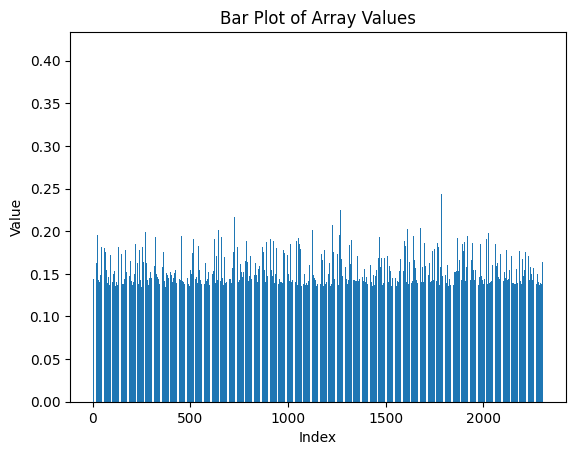

0.4127154
0.13237937
the prediction is  [[0.16989094]
 [0.14652345]
 [0.14818813]
 ...
 [0.161536  ]
 [0.16057341]
 [0.13745521]]

-------
[[1.]
 [1.]
 [1.]
 ...
 [1.]
 [1.]
 [1.]]
1.0
1.0


In [114]:
pred_test = (["oK. I will sent it again"])
print(pred_test)

pred_test = tok.texts_to_sequences(pred_test)
print(pred_test)
padd = pad_sequences(pred_test,padding=padding_type)
print(padd)

print(model_1.predict(padd))

prediction = model_1.predict(v_padded)

print("\n-------")
plot_bars(np.array(prediction))
print(prediction.max())
print(prediction.min())

print("the prediction is ", prediction)

for i in range(prediction.size):
    prediction[i] = normalize_pred(prediction[i])

print("\n-------")
print(prediction)
print(prediction.max())
print(prediction.min())


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


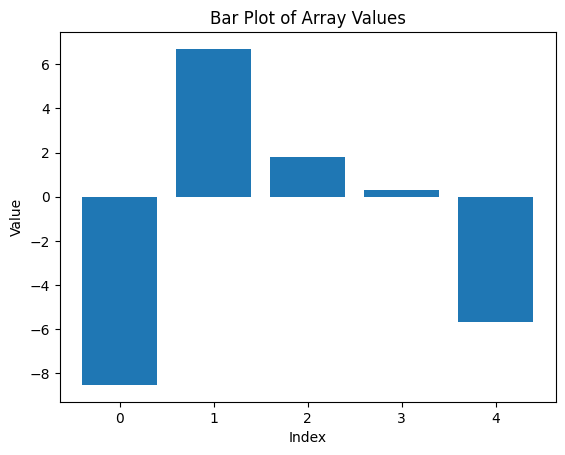

73/73 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step

-------


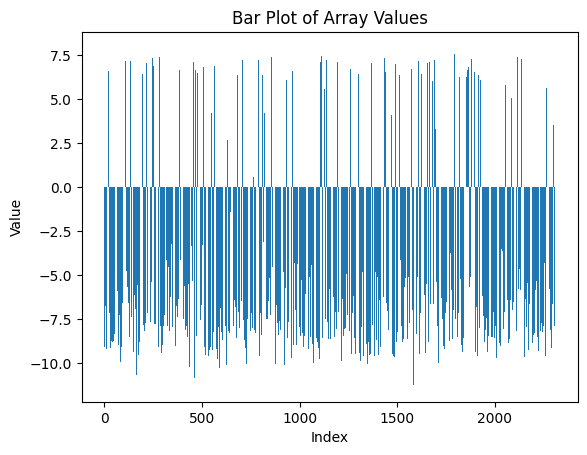

7.8549333
-11.247538


the prediction is  [[ -5.817143 ]
 [ -9.106929 ]
 [-11.034639 ]
 ...
 [ -9.059481 ]
 [-10.052868 ]
 [ -7.6501026]]

-------


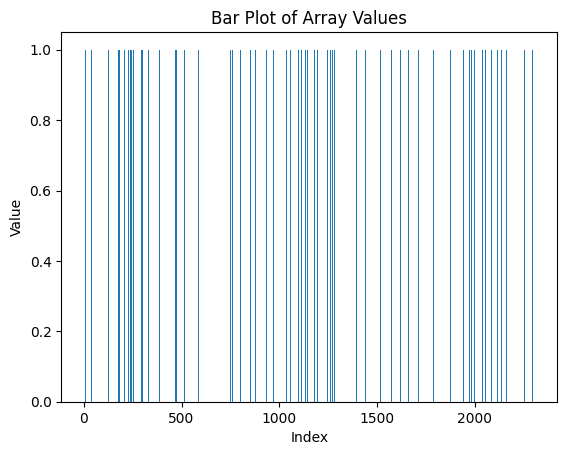

1.0
0.0


In [125]:
pred_test = (["oK. I will sent it again",
              "For the most sparkling shopping breaks from 45 per person; call 0121 2025050 or visit www.shortbreaks.org.uk",
              "Good news! You can still pay with GGives at your favorite online and offline stores with your increased credit limit. Continue to shop and get to pay in up to 24 installments with up to 0% interest! This special credit limit offer is only from 03/30 - 04/10. Tap Borrow > GGives on your GCash app to know more.",
              "to install the requirements, make sure that your virtual environment is activated the console tells you by displaying a text like this `(venv)` before every line",
              "hello how are you"
              ])

pred_test = tok.texts_to_sequences(pred_test)
padd = pad_sequences(pred_test,padding=padding_type)

plot_bars(LSTM_model.predict(padd))

prediction = LSTM_model.predict(v_padded)

print("\n-------")
plot_bars(prediction)
print(prediction.max())
print(prediction.min())

print("\n\nthe prediction is ", prediction)

for i in range(prediction.size):
    prediction[i] = normalize_pred(prediction[i])

print("\n-------")
plot_bars(prediction)
print(prediction.max())
print(prediction.min())

## GRAPH BARs

In [352]:
import matplotlib.pyplot as plt
import numpy as np

def plot_performance(models, tech, performance, file_name):
    # Create a bar plot
    plt.figure(figsize=(10, 10))
    bar_height = 0.2
    r = [np.arange(len(performance[0]))]
    for i in range(1, len(models)):
        r.append([x + bar_height for x in r[-1]])

    colors = ['#ffa600', '#6699b1', '#C1666B', '#003f5c', 'c', 'm', 'k']
    for i in range(len(models)):
        bars = plt.barh(r[i], performance[i], color=colors[i % len(colors)], height=bar_height, edgecolor=colors[i % len(colors)], label=models[i])
        for bar, value in zip(bars, performance[i]):
            plt.text(2, bar.get_y() + bar.get_height() / 2, f'{value}%', va='center', ha='left', color='black', fontweight='bold')
        

    # Adding yticks
    plt.title('Convetional Models', fontweight='bold')
    plt.xlabel('Accuracy (%)')
    plt.yticks([r + bar_height for r in range(len(performance[0]))], tech)

   
    plt.legend(loc='lower center')
    
    #plt.axis('off')
    plt.gca().set_position([.24, .1, .5, .45])
    plt.savefig("UREPosterAndAssignments/"+file_name, format="svg")
    plt.show()

# Example usage:



[99.05, 99.44, 93.85, 98.87]


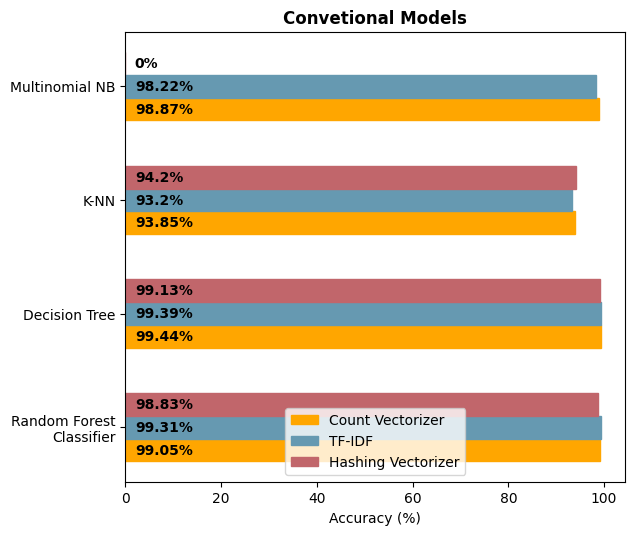

In [353]:
models = ['Random Forest\nClassifier', 'Decision Tree','K-NN','Multinomial NB']
tech = ['Count Vectorizer', 'TF-IDF', 'Hashing Vectorizer']
performance = [Count_V, Tfid_model, hv_model]

print(Count_V)
plot_performance(tech,models, performance,file_name="conventional.svg")

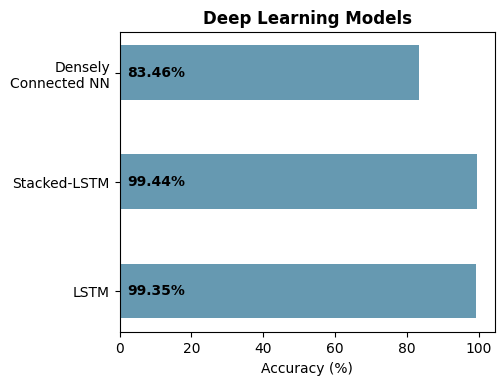

In [354]:
import matplotlib.pyplot as plt

# Data
models = ['LSTM', 'Stacked-LSTM', 'Densely\nConnected NN']
performance = [99.35, 99.44, 83.46]

# Create horizontal bar graph
plt.figure(figsize=(5, 10))
bars = plt.barh(models, performance, color='#6699B1',height=.5)

# Add values inside the bars
for bar in bars:
    plt.text(2, bar.get_y() + bar.get_height() / 2,
             f'{bar.get_width():.2f}%', ha='left', va='center', color='black',fontweight='bold')


# Add labels and title
plt.xlabel('Accuracy (%)')
plt.title('Deep Learning Models',fontweight='bold')
plt.gca().set_position([0.24, .66, .75, .3])
plt.savefig("dl.svg", format="svg")
# Show plot
plt.show()

